# 3 неделя

In [1]:
import cv2 as cv
import numpy as np
import imutils
import matplotlib.pyplot as plt

In [2]:
def print_image(image):
    plt.figure(figsize=(50, 50))
    plt.subplot(),plt.imshow(image)
    plt.xticks([]),plt.yticks([])
    plt.show()

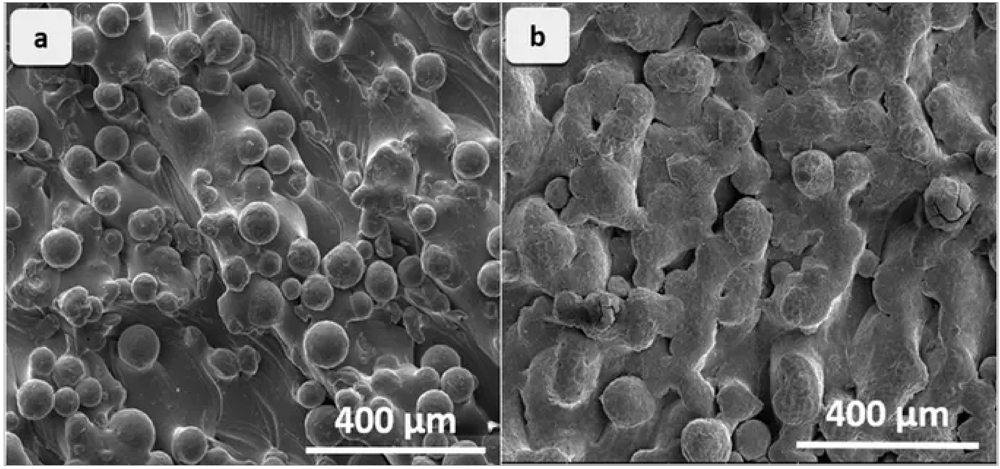

In [3]:
img = cv.imread('/Users/liyakul/Desktop/proekt/microphoto.jpg')
print_image(img)

Я решила добавить ко всем предыдущим функциям cv.Canny()

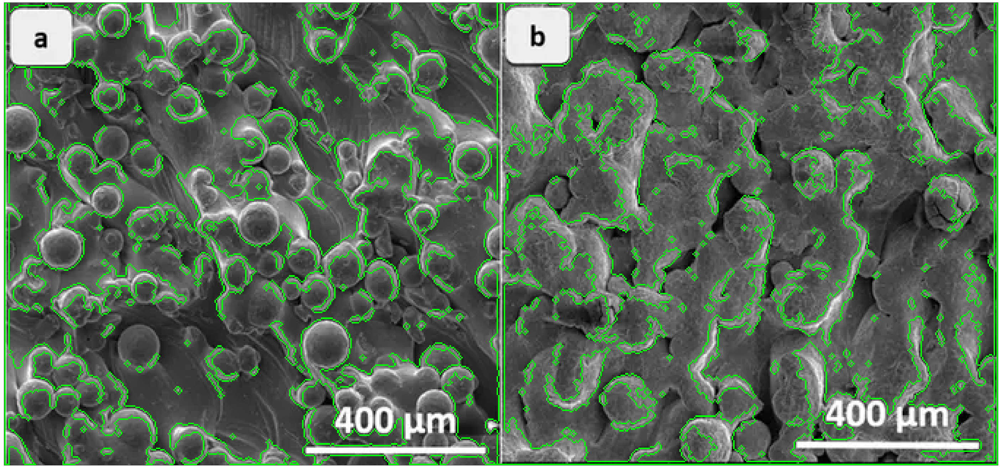

In [4]:
clone3 = img.copy()
gray = cv.cvtColor(clone3, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray, 127, 255, 0)
bil = cv.bilateralFilter(thresh, 5, 175, 175)
gray = cv.Canny(gray, 100, 200)
contours, hierarchy = cv.findContours(bil, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
cv.drawContours(clone3, contours, -1, (0,255,0), 1)
print_image(clone3)

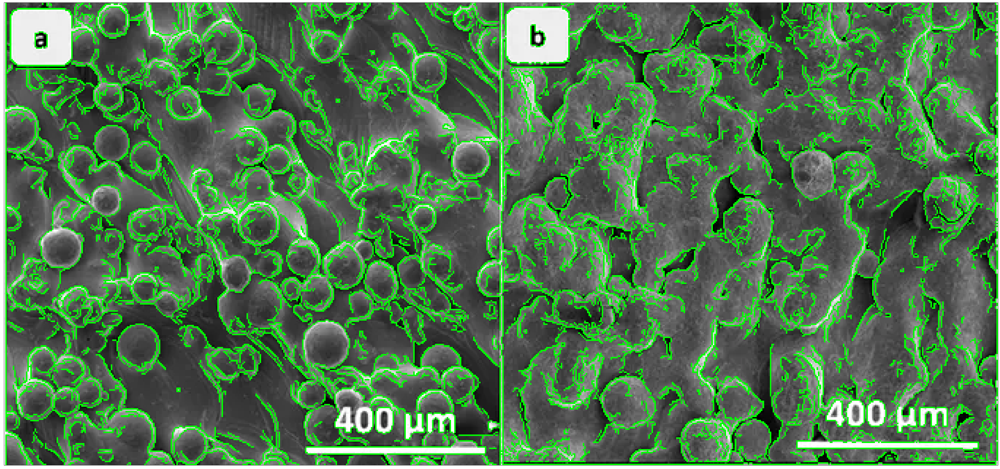

In [5]:
clone3 = img.copy()
gray2 = cv.cvtColor(clone3, cv.COLOR_BGR2GRAY)
gray2 = cv.Canny(gray2, 100, 200)
ret, thresh = cv.threshold(gray2, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
cv.drawContours(clone3, contours, -1, (0,255,0), 1)
print_image(clone3)

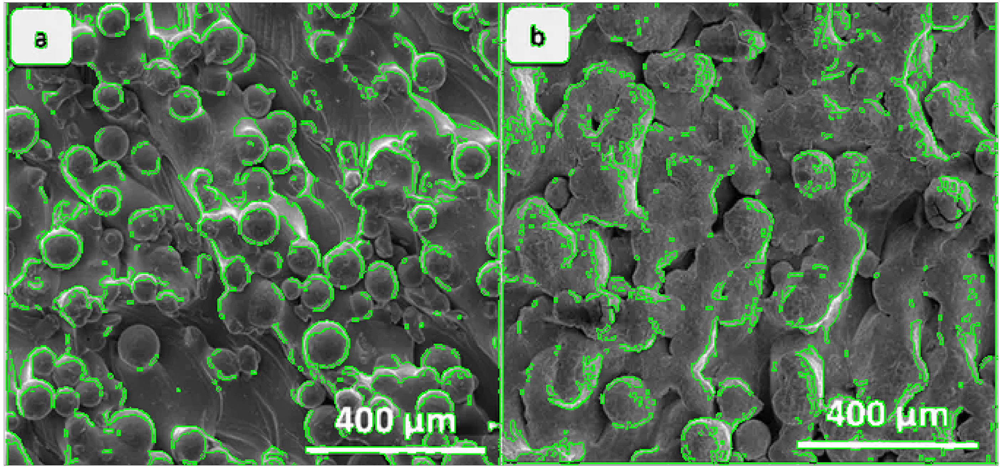

In [6]:
clone3 = img.copy()
gray = cv.cvtColor(clone3, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray, 127, 255, 0)
bil = cv.bilateralFilter(thresh, 5, 175, 175)
edge = cv.Canny(bil, 75, 200)
contours, hierarchy = cv.findContours(edge, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
cv.drawContours(clone3, contours, -1, (0,255,0), 1)
print_image(clone3)

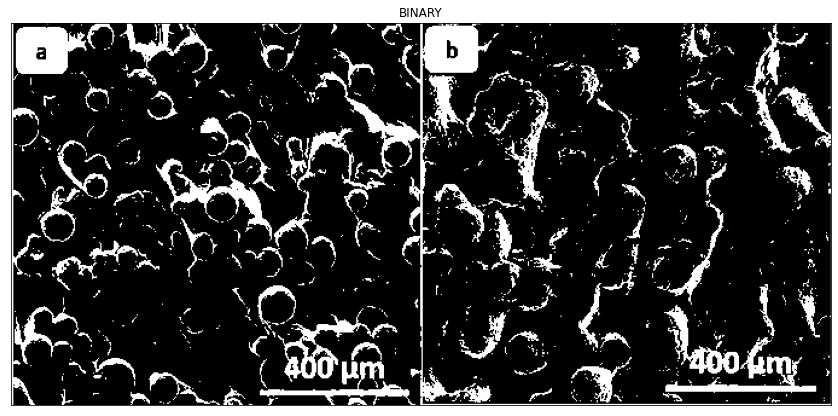

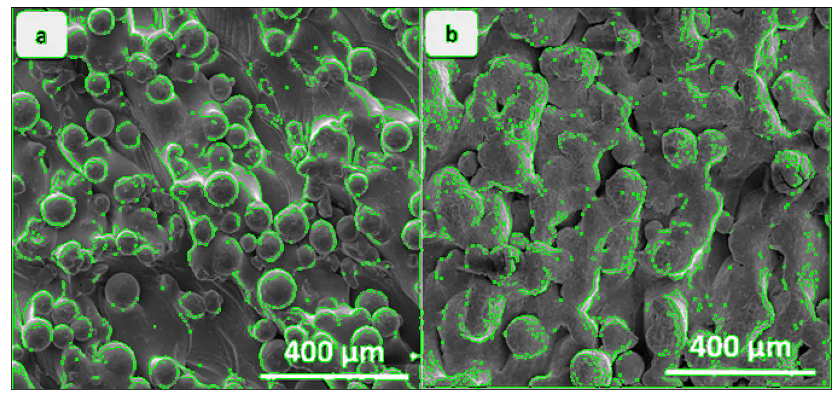

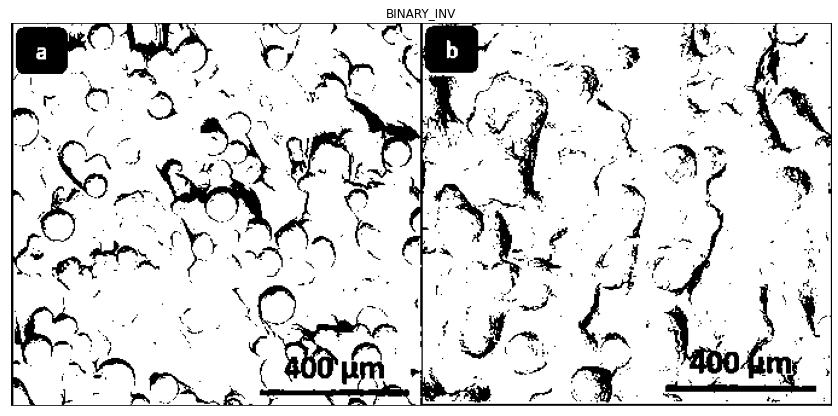

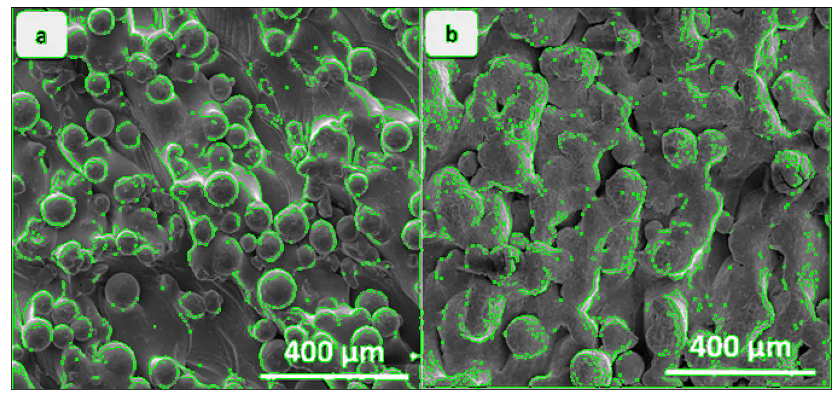

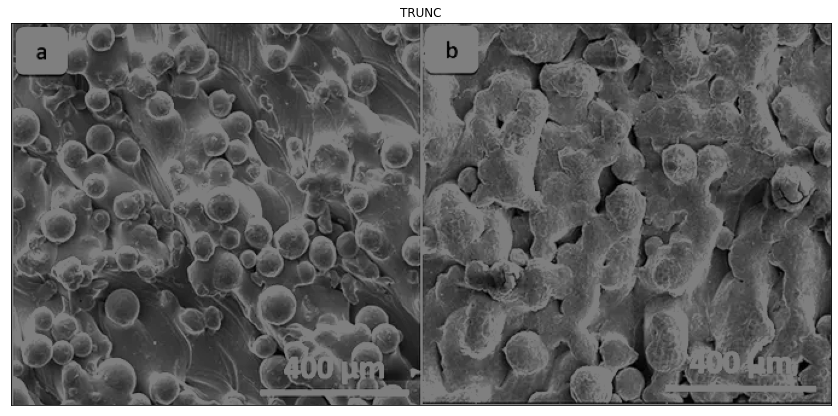

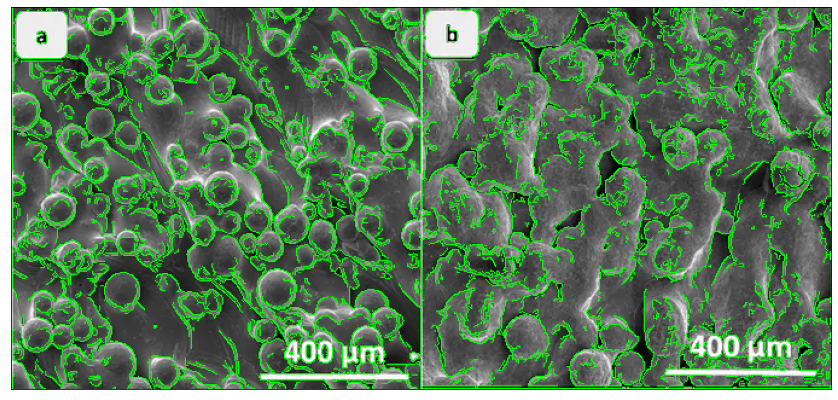

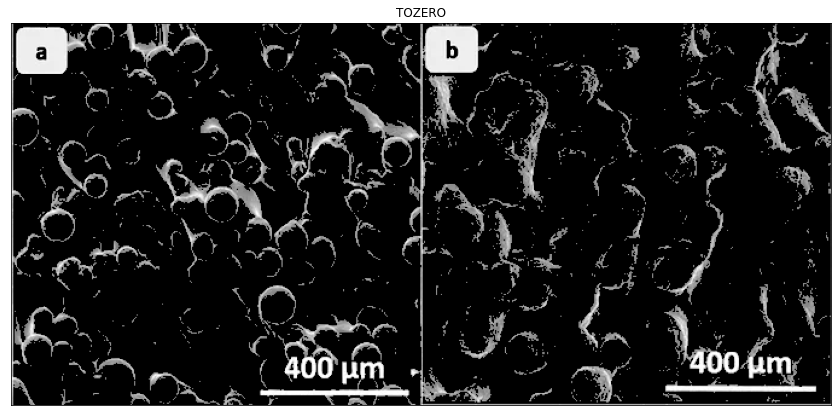

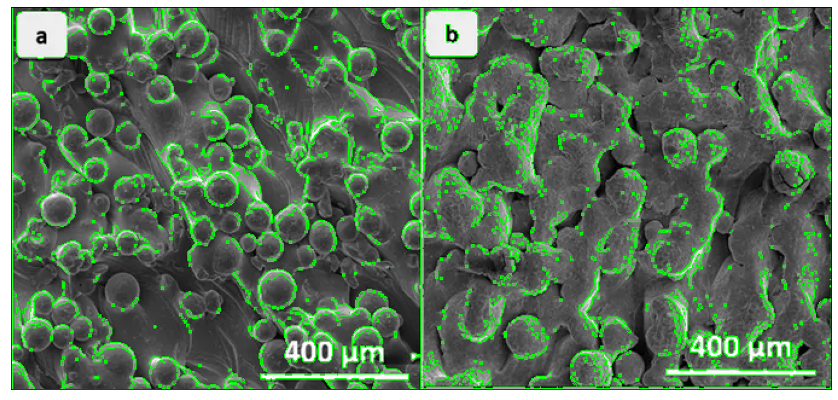

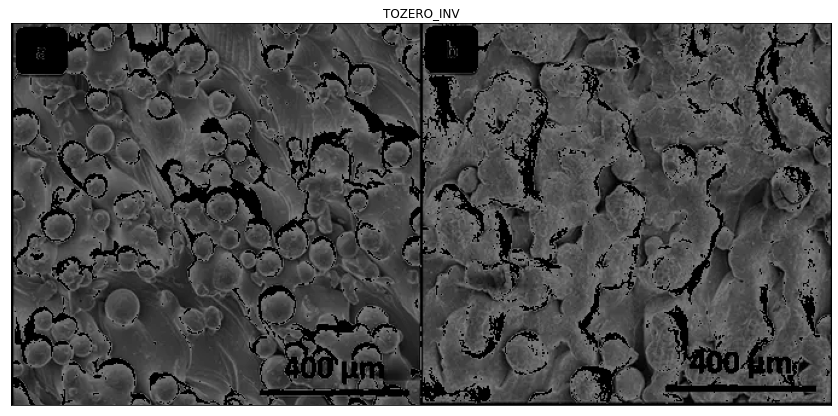

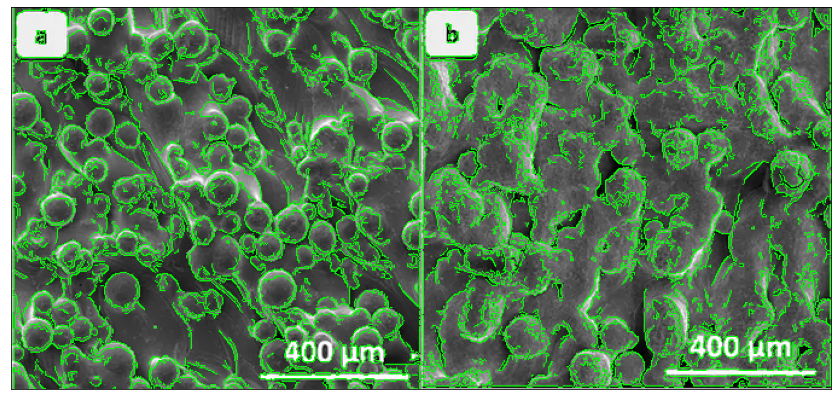

In [7]:
ret,thresh1 = cv.threshold(gray,127,255,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(gray,127,255,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(gray,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(gray,127,255,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(gray,127,255,cv.THRESH_TOZERO_INV)
titles = ['BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
threshes = [thresh1, thresh2, thresh3, thresh4, thresh5]
images = [img.copy(), img.copy(), img.copy(), img.copy(), img.copy()]
for i in range(5):
    plt.figure(figsize=(50, 50))
    plt.subplot(2,3,i+1),plt.imshow(threshes[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
    threshes[i] = cv.Canny(threshes[i], 100, 200)
    contours, hierarchy = cv.findContours(threshes[i], cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    cv.drawContours(images[i], contours, -1, (0,255,0), 1)
#     print_image(images[i])
    plt.figure(figsize=(50, 50))
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.xticks([]),plt.yticks([])
plt.show()

Добавление функций cv.getStructuringElement() и  cv.morphologyEx()

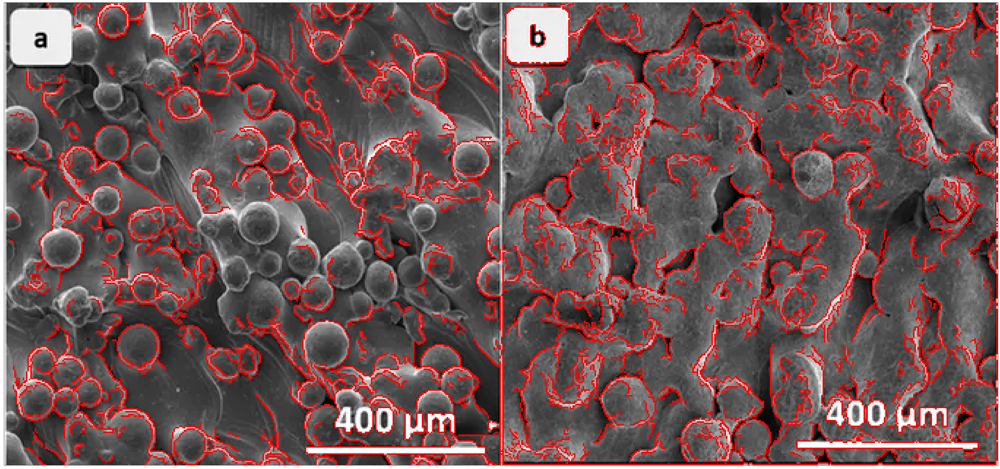

In [8]:
clone3 = img.copy()
gray2 = cv.cvtColor(clone3, cv.COLOR_BGR2GRAY)
canny2 = cv.Canny(gray2, 100, 200)
ret, thresh = cv.threshold(canny2, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

contour_list = []
for contour in contours:
    approx = cv.approxPolyDP(contour,0.02*cv.arcLength(contour,True),True)
    area = cv.contourArea(contour)
    if ((len(approx) >= 8)):
        contour_list.append(contour)
 
# Draw contours
cv.drawContours(clone3, contour_list, -1, (255,0,0), 1)

print_image(clone3)

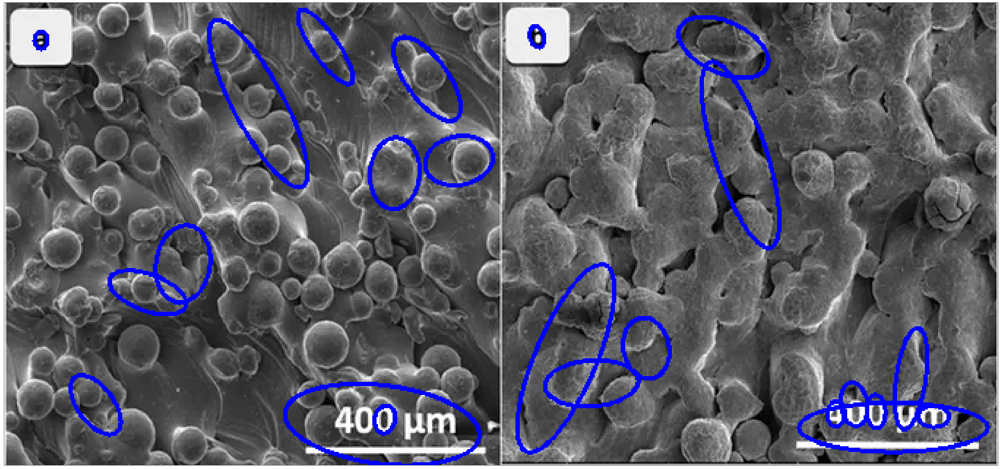

In [9]:
clone5 = img.copy()
gray5 = cv.cvtColor(clone5, cv.COLOR_BGR2GRAY)
canny5 = cv.Canny(gray5, 100, 200)
ret, thresh = cv.threshold(canny5, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
for i in range(0, len(contours)):
    contour = contours[i]
    approx = cv.approxPolyDP(contour,0.02*cv.arcLength(contour,True),True)
    area = cv.contourArea(contour)
    if ((10 >= len(approx) >= 5) & (1000 >= len(contour) >= 5) & (1000 > area > 50)):
        ellipse = cv.fitEllipse(contour)
        (center,axes,orientation) =ellipse
        majoraxis_length = max(axes)
        minoraxis_length = min(axes)
        eccentricity=(np.sqrt(1-(minoraxis_length/majoraxis_length)**2))
        cv.ellipse(clone5,ellipse,(0,0,255),2)
print_image(clone5)

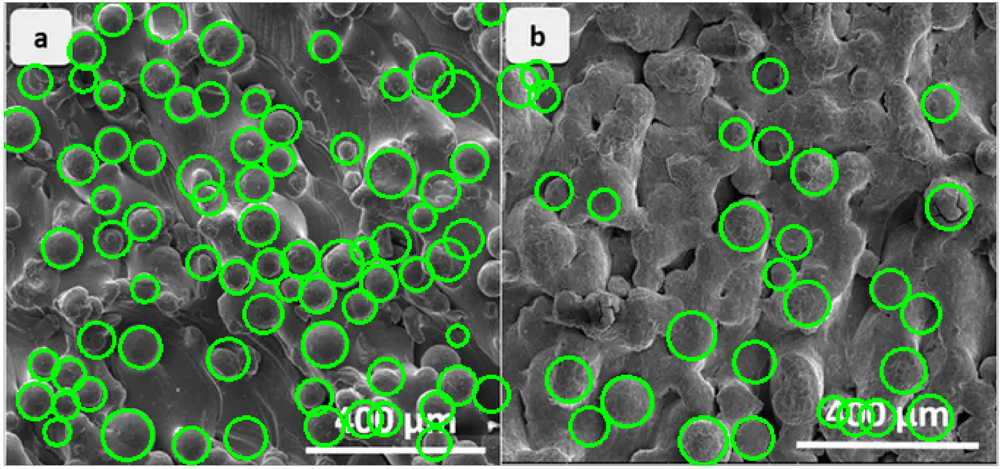

In [10]:
clone6 = img.copy()
gray6 = cv.cvtColor(clone6, cv.COLOR_BGR2GRAY)


circles = cv.HoughCircles(gray6,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=20)
circles = np.uint16(np.around(circles))
for i in circles[0,:]:
    # draw the outer circle
    cv.circle(clone6,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
#     cv.circle(clone6,(i[0],i[1]),2,(0,0,255),3)
print_image(clone6)

На этом моменте я нашла новую функцию cv.HoughCircles(), которая работает лучше чем любая предыдущая функция. Я попросила у Галины Михайловны фото шарообразных микроструктур, попробуем функцию на них и на тех, которые мне присылали

In [11]:
def find_circles_0(path):
    img_ = cv.imread(path)
    clone_ = img_.copy()
    gray_ = cv.cvtColor(clone_, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray_,cv.HOUGH_GRADIENT_ALT,1.5,10,
                            param1=1,param2=0.4,minRadius=0,maxRadius=20)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv.circle(clone_,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(clone_)

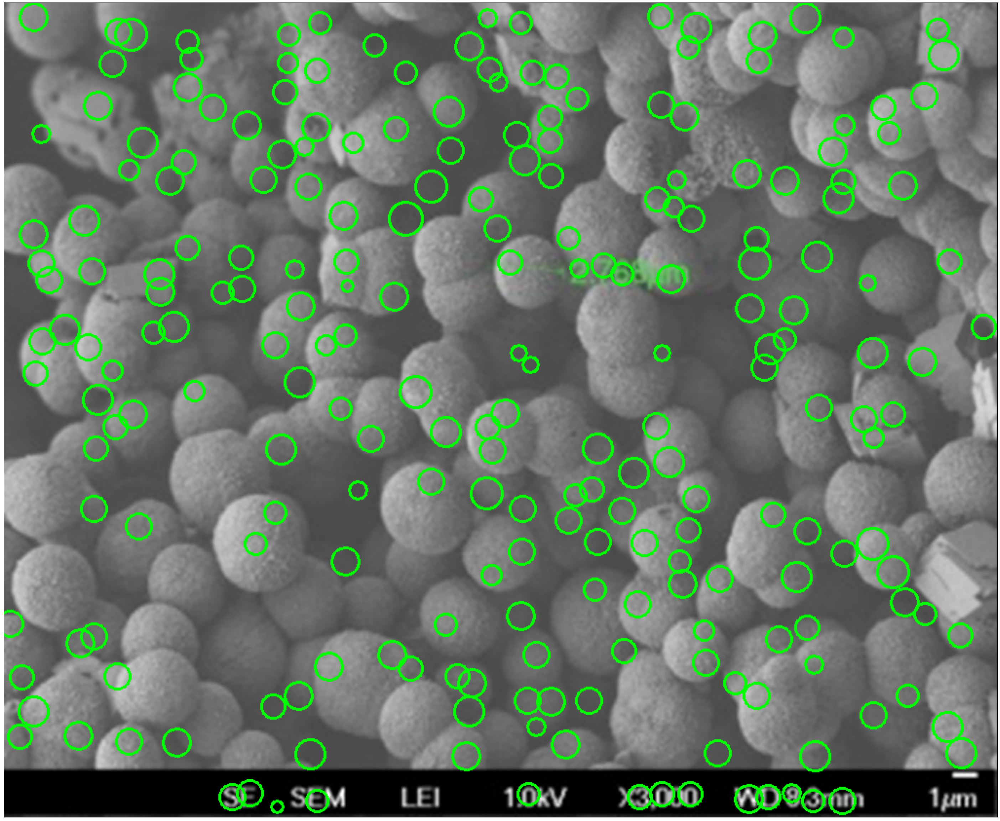

In [12]:
find_circles_0('/Users/liyakul/Desktop/proekt/microphoto2.png')

Очевидно, нужно выбрать другой размер. Будем передавать в функцию параметры.

In [13]:
def find_circles(path, mind, par1, par2, minr, maxr):
    img_ = cv.imread(path)
    clone_ = img_.copy()
    gray_ = cv.cvtColor(clone_, cv.COLOR_BGR2GRAY)
    circles = cv.HoughCircles(gray_,cv.HOUGH_GRADIENT_ALT,1.5,mind,
                            param1=par1,param2=par2,minRadius=minr,maxRadius=maxr)
    circles = np.uint16(np.around(circles))
    for i in circles[0,:]:
        cv.circle(clone_,(i[0],i[1]),i[2],(0,255,0),2)
    print_image(clone_)

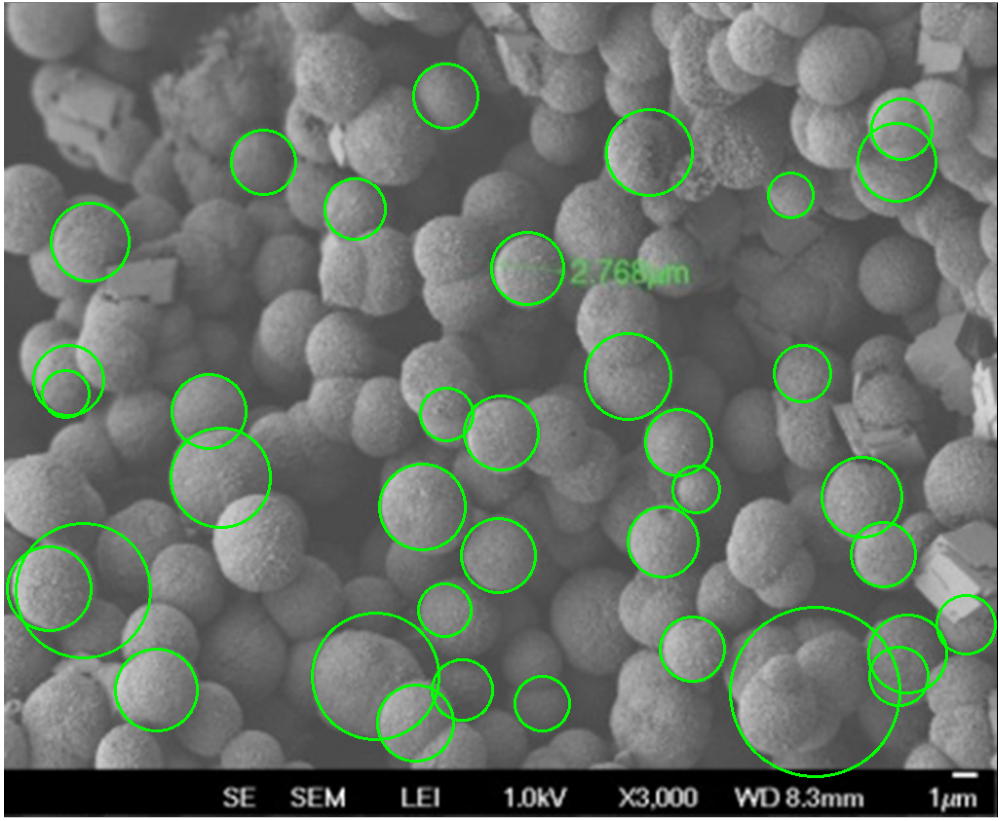

In [14]:
find_circles('/Users/liyakul/Desktop/proekt/microphoto2.png', 10, 100, 0.7, 20, 100)

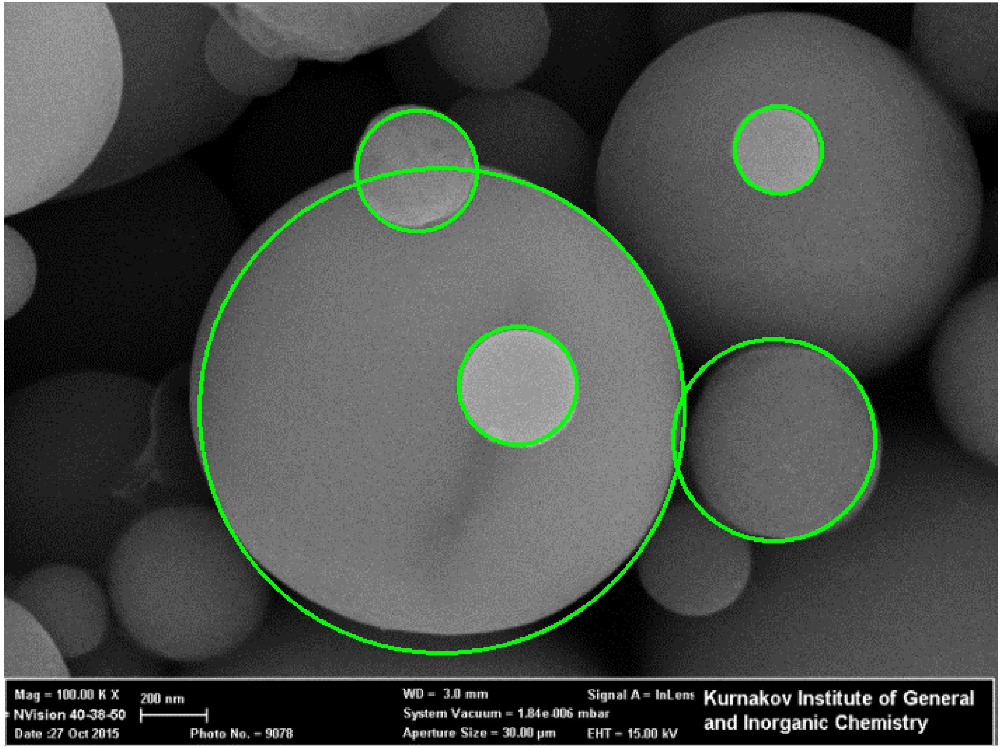

In [15]:
find_circles('/Users/liyakul/Desktop/СЭМ ШАР/3.bmp', 15, 100, 0.7, 20, 0)

В следующий раз буду корректировать параметры функции, попробую использовать gaussian_blur.